In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import harmonypy
import pymn
import scrublet as scr
import gseapy as gp
from gseapy.plot import barplot, dotplot
import bottleneck
import pyreadr
from scipy.io import mmread
import scipy
from sklearn import preprocessing
import random as rd
import scib
from matplotlib_venn import venn2,venn2_circles,venn3
from pyscenic.export import export2loom, add_scenic_metadata
from sklearn.decomposition import NMF
from sklearn import metrics
import palettable
from pyscenic.rss import regulon_specificity_scores
import matplotlib.image as mpimg
from scipy import stats
from sklearn import metrics
import palettable

/public/home/guogjgroup/ggj/anaconda3/lib/python3.9/site-packages/pyMetaNeighbor-0.1.0-py3.9.egg/pymn/trainModel.py:29: SyntaxWarning: "is not" with a literal. Did you mean "!="?
/public/home/guogjgroup/ggj/anaconda3/lib/python3.9/site-packages/pyMetaNeighbor-0.1.0-py3.9.egg/pymn/trainModel.py:29: SyntaxWarning: "is not" with a literal. Did you mean "!="?
Error: package or namespace load failed for 'methods' in dyn.load(file, DLLpath = DLLpath, ...):
 unable to load shared object '/public/home/guogjgroup/ggj/anaconda3/envs/R3.6/lib/R/library/methods/libs/methods.so':
  libR.so: cannot open shared object file: No such file or directory
During startup - Warning messages:
1: package 'methods' was built under R version 3.6.3 
2: package "methods" in options("defaultPackages") was not found 
3: package 'datasets' was built under R version 3.6.3 
4: package 'grDevices' was built under R version 3.6.3 
5: package 'graphics' was built under R version 3.6.3 
6: package 'methods' was built under

In [2]:
sc.set_figure_params(dpi = 200, color_map = 'viridis_r' )
sc.settings.verbosity = 2

/public/home/guogjgroup/ggj/anaconda3/lib/python3.9/site-packages/scanpy/_settings.py:447: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  IPython.display.set_matplotlib_formats(*ipython_format)


In [3]:
def type_composition(adata_used, clustering_used, type_displayed):
    
    cluster_stat_all = pd.DataFrame()

    for each_tissue in np.unique(adata_used.obs[type_displayed]).tolist():

        each_tissue_stat = pd.DataFrame(adata_used[adata_used.obs[type_displayed] == each_tissue].obs[clustering_used].value_counts())
        each_tissue_stat.columns = [each_tissue]
        cluster_stat_all = pd.concat([each_tissue_stat, cluster_stat_all], axis = 1)

    cluster_stat_all = cluster_stat_all.fillna(0)
    column_list = cluster_stat_all.columns.tolist()
    cluster_stat_all['all_cell'] = cluster_stat_all.sum(axis=1)

    for i in column_list:

        cluster_stat_all[i] = cluster_stat_all[i]/cluster_stat_all['all_cell']

    del cluster_stat_all['all_cell']

    cluster_stat_all['cluster'] = cluster_stat_all.index
    #cluster_stat_all['cluster'] = cluster_stat_all['cluster'].astype(int)
    cluster_stat_all = cluster_stat_all.sort_values('cluster')

    del cluster_stat_all['cluster']

    with plt.rc_context({"figure.figsize": (16, 3), "figure.dpi": (200)}):
        cluster_stat_all.plot(kind = 'bar', stacked = True)
        plt.grid(False)
    #        plt.axis('off')
        plt.legend(bbox_to_anchor=(1.0, 1.0))

# Reesults Display

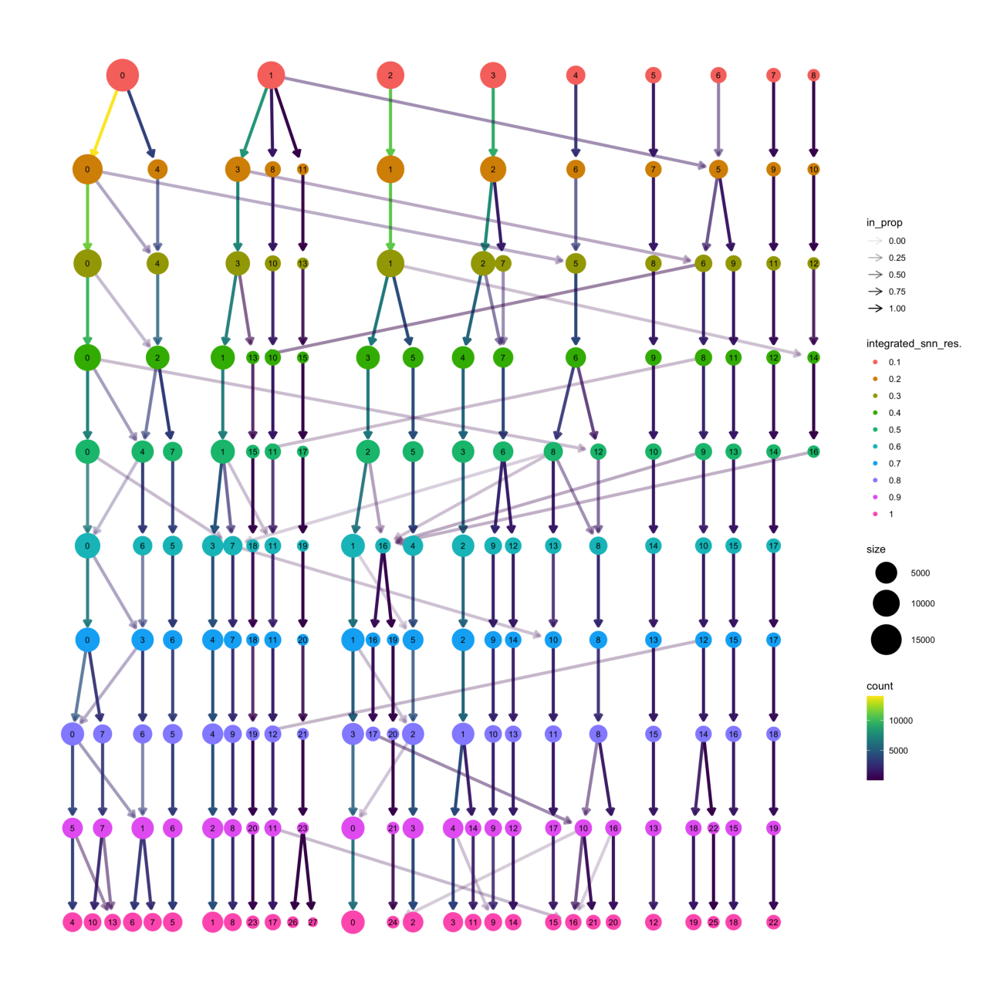

In [14]:
plt.imshow(mpimg.imread("adata_for_seurat_stromal_no_AML_sct_cluster_multiple_res_clustree.png"))
plt.grid(False)
plt.axis('off')
plt.show()

# Annotation: Resolution = 0.5

In [5]:
adata = sc.read('/public/home/guogjgroup/ggj/matq_analysis/pan_cancer/all_cell/adata_all_cell_raw_with_anno_latest.h5ad')
adata_res = sc.read('adata_all_stromal_cell_sct_marker.h5ad')

adata = adata[adata_res.obs.index.tolist(), :]

adata.obs['leiden'] = adata_res.obs['res_0.5']
adata.uns['all_cell_marker'] = adata_res.uns['res_0.5_marker']

adata_graph = sc.read('adata_for_seurat_stromal_no_AML_sct.h5ad')
adata = adata[adata_graph.obs.index.tolist(), :]

adata.obsm['X_umap'] = adata_graph.obsm['X_umap']
adata.obsm['X_pca'] = adata_graph.obsm['X_pca']

adata.write('adata_all_stromal_cell_sct_annotation_latest.h5ad')

/tmp/ipykernel_9917/1349135425.py:6: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['leiden'] = adata_res.obs['res_0.5']


In [20]:
clustering_used = 'leiden'

anno_df = adata.obs[[clustering_used]].copy()

anno_df[clustering_used].replace('0', 'CAF_LAMA2 high', inplace=True)

anno_df[clustering_used].replace('1', 'CAF_SHANK2 high', inplace=True)

anno_df[clustering_used].replace('2', 'CAF_SNTB1 high', inplace=True)

anno_df[clustering_used].replace('3', 'Myofibroblast_MYH11 high', inplace=True)

anno_df[clustering_used].replace('4', 'Matrix CAF_MIR100HG high', inplace=True)
    
anno_df[clustering_used].replace('5', 'CAF_TNC high', inplace=True)

anno_df[clustering_used].replace('6', 'Myofibroblast_ACTN1 high', inplace=True)

anno_df[clustering_used].replace('7', 'Matrix CAF_FN1 high', inplace=True)

anno_df[clustering_used].replace('8', 'CAF_TNXB high', inplace=True)

anno_df[clustering_used].replace('9', 'MT high CAF', inplace=True)

anno_df[clustering_used].replace('10', 'Antigen-presenting CAF', inplace=True)

anno_df[clustering_used].replace('11', 'Matrix CAF_NOTCH3 high', inplace=True)

anno_df[clustering_used].replace('12', 'CAF_CRISPLD2 high', inplace=True)

anno_df[clustering_used].replace('13', 'CAF_LRP1B high', inplace=True)

anno_df[clustering_used].replace('14', 'CAF_GNA14 high', inplace=True)

anno_df[clustering_used].replace('15', 'CAF_RP11-108K3.1 high', inplace=True)

anno_df[clustering_used].replace('16', 'CAF_RIMS4 high', inplace=True)

anno_df[clustering_used].replace('17', 'CAF_MYBPC1 high', inplace=True)

anno_df['anno'] = anno_df[clustering_used].astype(str)

anno_df = anno_df.loc[adata.obs.index.tolist(), :]
adata.obs['anno'] = anno_df['anno'].copy()
adata.obs['anno'] = adata.obs['anno'].astype(str)

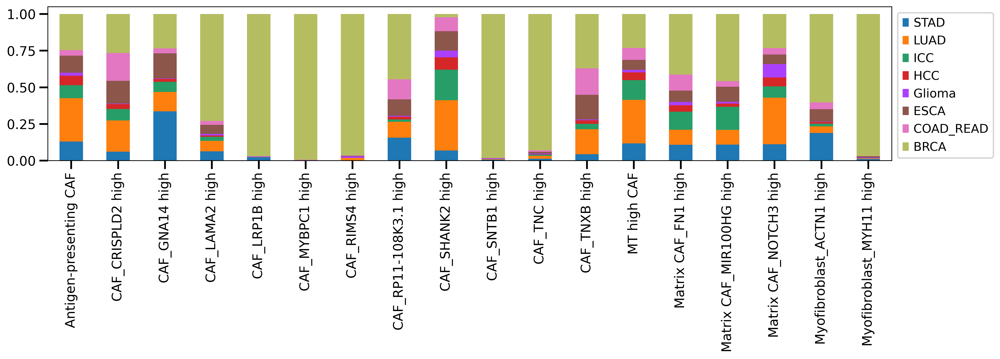

In [27]:
type_composition(adata, 'anno', 'cancer_type')
plt.savefig('figures/type_composition_cancer_type.pdf')

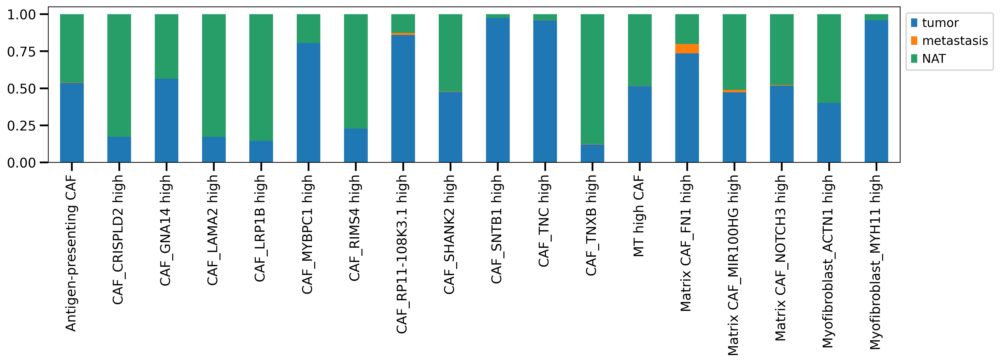

In [28]:
adata.obs['tissue'] = adata.obs['sample'].str.split('_', expand=True)[2]
type_composition(adata, 'anno', 'tissue')
plt.savefig('figures/type_composition_tissue.pdf')

In [29]:
adata_raw = sc.read('adata_all_stromal_cell_sct_annotation_latest.h5ad')
adata_raw = adata_raw[adata.obs.index.tolist(), :]
adata_raw.obs['tissue'] = adata_raw.obs['sample'].str.split('_', expand=True)[2]
adata_raw.obs['anno'] = adata.obs['anno']
adata_raw.write('adata_all_stromal_cell_sct_annotation_latest.h5ad')

/tmp/ipykernel_31594/1796180664.py:3: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_raw.obs['tissue'] = adata_raw.obs['sample'].str.split('_', expand=True)[2]


In [31]:
all_marker_df_sorted = pd.read_csv('stromal_marker_each_cancer_stat_sorted.csv')
leiden2anno = adata.obs[['leiden', 'anno']].copy()
leiden2anno.drop_duplicates(keep='first',inplace=True)

leiden2anno['leiden'] = leiden2anno['leiden'].astype(str)
all_marker_df_sorted['cluster'] = all_marker_df_sorted['cluster'].astype(str)

leiden2anno.index = leiden2anno['leiden']
del leiden2anno['leiden']

for i in all_marker_df_sorted.index.tolist():
    
    all_marker_df_sorted.loc[i, 'anno'] = leiden2anno.loc[all_marker_df_sorted.loc[i, 'cluster'], 'anno']
    
all_marker_df_sorted.to_csv('stromal_marker_each_cancer_stat_sorted.csv', index=None)   

In [33]:
adata = sc.read('adata_all_stromal_cell_sct_annotation_latest.h5ad')
len(np.unique(adata.obs['anno']).tolist())

18

In [34]:
len(np.unique(adata.obs['leiden']).tolist())

18

In [35]:
all_marker_df_sorted = pd.read_csv('stromal_marker_each_cancer.csv')
leiden2anno = adata.obs[['leiden', 'anno']].copy()
leiden2anno.drop_duplicates(keep='first',inplace=True)

leiden2anno['leiden'] = leiden2anno['leiden'].astype(str)
all_marker_df_sorted['cluster'] = all_marker_df_sorted['cluster'].astype(str)

leiden2anno.index = leiden2anno['leiden']
del leiden2anno['leiden']

for i in all_marker_df_sorted.index.tolist():
    
    all_marker_df_sorted.loc[i, 'anno'] = leiden2anno.loc[all_marker_df_sorted.loc[i, 'cluster'], 'anno']
    
all_marker_df_sorted.to_csv('stromal_marker_each_cancer.csv', index=None)    

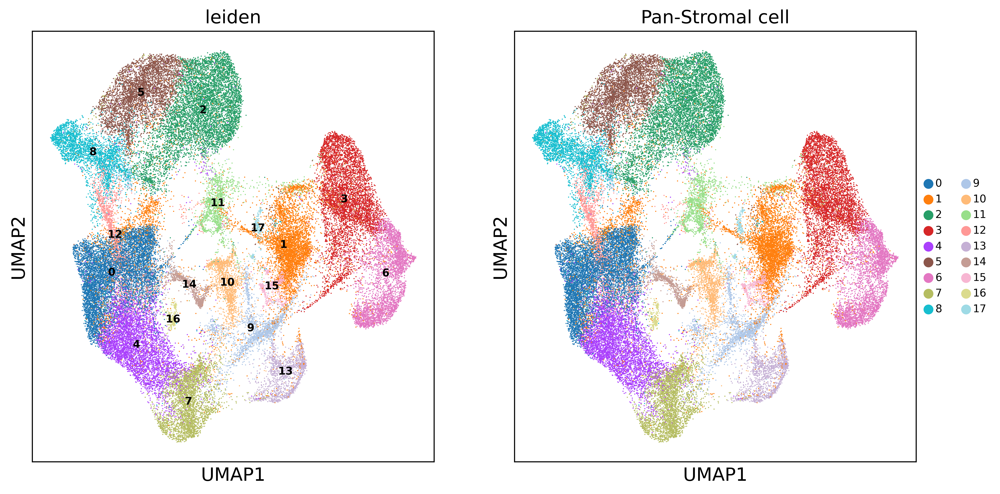

In [43]:
adata = sc.read('adata_all_stromal_cell_sct_annotation_latest.h5ad')

fig, axs = plt.subplots(1, 2, figsize = (12,6), dpi = 300)
sc.pl.umap(adata, color = 'leiden', size = 3, legend_loc = 'on data', legend_fontsize = 'xx-small', ax=axs[0], show=False)
sc.pl.umap(adata, color = 'leiden', size = 3, legend_fontsize = 'xx-small', title = 'Pan-Stromal cell',
           ax=axs[1], show=False)

plt.savefig('figures/stromal_umap.pdf')

In [5]:
adata = sc.read('adata_all_stromal_cell_sct_annotation_latest.h5ad')

sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
sc.pp.scale(adata)

normalizing counts per cell
    finished (0:00:00)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


/public/home/guogjgroup/ggj/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_baseplot_class.py:510: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  matplotlib.colorbar.ColorbarBase(


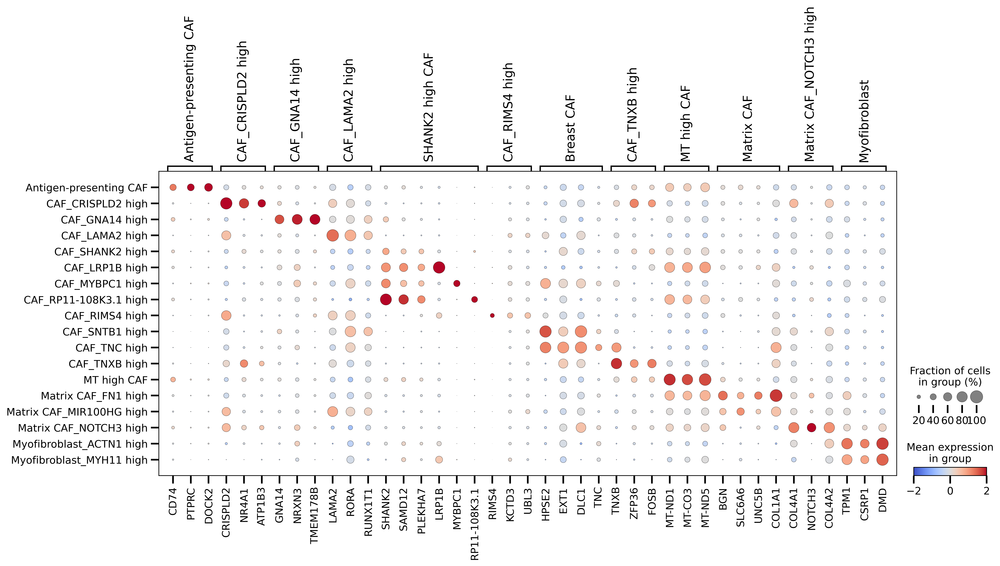

In [9]:
adata.obs['anno'] = adata.obs['anno'].astype('category')

adata.obs['anno'] = adata.obs['anno'].cat.reorder_categories(['Antigen-presenting CAF',
 'CAF_CRISPLD2 high',
 'CAF_GNA14 high',
 'CAF_LAMA2 high',
 'CAF_SHANK2 high',                                                             
 'CAF_LRP1B high',
 'CAF_MYBPC1 high',
 'CAF_RP11-108K3.1 high',                                                           
 'CAF_RIMS4 high',
 'CAF_SNTB1 high',
 'CAF_TNC high',
 'CAF_TNXB high',
 'MT high CAF',
 'Matrix CAF_FN1 high',
 'Matrix CAF_MIR100HG high',
 'Matrix CAF_NOTCH3 high',
 'Myofibroblast_ACTN1 high',
 'Myofibroblast_MYH11 high'])

sc.pl.dotplot(adata, marker_dict, groupby = 'anno', use_raw = False, 
              vmin=-2, vmax=2, cmap = 'coolwarm', save='_stromal.pdf')